In [0]:
from tensorflow.python.keras.datasets import mnist
from tensorflow.python.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.python.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.python.keras.layers.advanced_activations import LeakyReLU
from tensorflow.python.keras.layers.convolutional import UpSampling2D, Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.python.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models

import numpy as np

In [0]:
def sample_images(epoch, latent_dim, generator):
    r, c = 5, 5
    # generate image from noise
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # rescale images 0..1
    gen_imgs = 0.5 * gen_imgs + 0.5

    print('img_shape: ', gen_imgs.shape)
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
      for j in range(c):
        axs[i,j].imshow(gen_imgs[cnt, :,:,0])
        axs[i,j].axis('off')
        cnt += 1
    plt.show()
    plt.close()

In [0]:
# define constants (hard code)/ hyper parameters
batch_size = 32
IMG_SIZE = 28
latent_dim = 32
EPOCHS = 20000
sample_intervals = 50

### Generator

In [0]:
def build_generator(latent_dim):
  #generator_input = keras.Input(shape=(latent_dim,))
  model = Sequential()

  # reshape input to 7x7x256 tensor via dense layer
  model.add(Dense(128*14*14, input_dim=latent_dim))
  model.add(LeakyReLU())
  model.add(Reshape((14,14,128)))

  # transposed convolution, from 7,7,256 to 14,14,128 (instead of max pool upsampling)
  model.add(Conv2D(256, kernel_size=5, padding='same')) 
  model.add(LeakyReLU())

  # transposed convolution, from 14,14,128 to 14,14,64 (instead of max pool upsampling)
  model.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same'))
  model.add(LeakyReLU())

  model.add(Conv2D(256, kernel_size=5, padding='same')) 
  model.add(LeakyReLU())
  model.add(Conv2D(256, kernel_size=5, padding='same')) 
  model.add(LeakyReLU())

  model.add(Conv2D(1, kernel_size=7, padding='same'))
  model.add(Activation('tanh'))

  print(model.summary())
  return model

### Discriminator

In [0]:
def build_discriminator(img_shape):
  model = Sequential()

  # convolution from 28,28,1 to 14,14,32
  model.add(Conv2D(128, kernel_size=3, padding='same', input_shape=img_shape))
  model.add(LeakyReLU())

  # convolution from 14,14,32 to 7,7,64
  model.add(Conv2D(128, kernel_size=4, strides=2, padding='same'))
  model.add(LeakyReLU())
  model.add(Conv2D(128, kernel_size=4, strides=2, padding='same'))
  model.add(LeakyReLU())
  model.add(Conv2D(128, kernel_size=4, strides=2, padding='same'))
  model.add(LeakyReLU())

  model.add(Flatten())
  # 1 dropout layer - important trick !!!
  model.add(Dropout(0.4))
  model.add(Dense(1, activation='sigmoid'))

  print(model.summary())
  return model

In [6]:
generator = build_generator(latent_dim)
discriminator = build_discriminator((IMG_SIZE, IMG_SIZE, 1))

# to stabilize training use lr decay and grad clipping (by value) in optimizer
optimizer_discriminator = Adam(learning_rate=0.0008, clipvalue=1.0, decay=1e-8)
discriminator.compile(optimizer=optimizer_discriminator, loss='binary_crossentropy')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 25088)             827904    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 25088)             0         
_________________________________________________________________
reshape (Reshape)            (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 14, 14, 256)       819456    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 256)       0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 28, 28, 256)       1048832   
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 28, 28, 256)       0

### GAN

In [12]:
# set discriminator weight to non-trainable (only apply to gan model)
discriminator.trainable = False

#gan = Sequential()
#gan.add(generator)
#gan.add(discriminator)

gan_input = Input(shape=(latent_dim,))
gan_output = discriminator(generator(gan_input))
gan = models.Model(gan_input, gan_output)

gan_optimizer = Adam(learning_rate=0.0004, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')
gan.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32)]              0         
_________________________________________________________________
sequential (Sequential)      (None, 28, 28, 1)         5986049   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 790145    
Total params: 6,776,194
Trainable params: 5,986,049
Non-trainable params: 790,145
_________________________________________________________________


### Training

In [15]:
import os
from keras_preprocessing import image

# load mnist data
(x_train, _), (_, _) = mnist.load_data()

# normalize data
x_train = x_train / 127.5 - 1

start = 0
for epoch in range(EPOCHS):
  # sample random points in latent space
  noise = np.random.normal(0, 1, (batch_size, latent_dim))
  gen_imgs = generator.predict(noise)

  # combine fake/ real imgs
  stop = start + batch_size
  real_imgs = x_train[start:stop][...,None]
  #print('check dims: ', gen_imgs.shape, real_imgs.shape)
  combined_imgs = np.concatenate([gen_imgs, real_imgs])

  # assemble labels discriminating ral/ fake imgs
  fake = np.zeros((batch_size, 1))
  valid = np.ones((batch_size, 1))
  labels = np.concatenate([fake, valid])
  # add random noise to the labels - important trick !!!
  labels += 0.05 * np.random.random(labels.shape)

  # train discriminator
  d_loss = discriminator.train_on_batch(combined_imgs, labels)

  # sample random points in latent space
  noise = np.random.normal(0, 1, (batch_size, latent_dim))
  misleading_targets = np.zeros((batch_size, 1))

  # train generator (via gan model, zhere discriminator weights are frozen)
  #print('check dims: ', noise.shape, misleading_targets.shape)
  #break
  g_loss = gan.train_on_batch(noise, misleading_targets)

  start += batch_size
  if start > len(x_train) - batch_size:
    # we went through all dataset
    start = 0

  # at save interval save generated image samples, make summary
    if epoch % sample_interval == 0:
      # plot progress: d_loss[0]-discr loss, d_loss[1]-discr acc
      print('%d [D loss: %f, acc.: %.2f%%] [G loss: %f]' % (epoch, d_loss[0], 100*d_loss[1], g_loss))
      # output a sample of generated images
      sample_images(epoch, latent_dim, generator)

NameError: ignored

-----------------------
### Reference solution Chollet

In [0]:
def sample_images(epoch, latent_dim, generator):
    r, c = 5, 5
    # generate image from noise
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # rescale images 0..1
    gen_imgs = 0.5 * gen_imgs + 0.5

    print('img_shape: ', gen_imgs.shape)
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
      for j in range(c):
        axs[i,j].imshow(gen_imgs[cnt, :,:,:])
        axs[i,j].axis('off')
        cnt += 1
    plt.show()
    plt.close()

In [7]:
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt

latent_dim = 32
height = 32
width = 32
channels = 3
sample_interval = 100

generator_input = keras.Input(shape=(latent_dim,))

# First, transform the input into a 16x16 128-channels feature map
x = layers.Dense(128 * 16 * 16)(generator_input)
x = layers.LeakyReLU()(x)
x = layers.Reshape((16, 16, 128))(x)

# Then, add a convolution layer
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

# Upsample to 32x32
x = layers.Conv2DTranspose(256, 4, strides=2, padding='same')(x)
x = layers.LeakyReLU()(x)

# Few more conv layers
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

# Produce a 32x32 1-channel feature map
x = layers.Conv2D(channels, 7, activation='tanh', padding='same')(x)
generator = keras.models.Model(generator_input, x)
generator.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 32)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 32768)             1081344   
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 32768)             0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 16, 16, 256)       819456    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 32, 32, 256)       1048

In [8]:
discriminator_input = layers.Input(shape=(height, width, channels))
x = layers.Conv2D(128, 3)(discriminator_input)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Flatten()(x)

# One dropout layer - important trick!
x = layers.Dropout(0.4)(x)

# Classification layer
x = layers.Dense(1, activation='sigmoid')(x)

discriminator = keras.models.Model(discriminator_input, x)
discriminator.summary()

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
discriminator_optimizer = keras.optimizers.RMSprop(lr=0.0008, clipvalue=1.0, decay=1e-8)
discriminator.compile(optimizer=discriminator_optimizer, loss='binary_crossentropy')

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 30, 30, 128)       3584      
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 14, 14, 128)       262272    
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 6, 6, 128)         262272    
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 6, 6, 128)         0   

In [0]:
# Set discriminator weights to non-trainable
# (will only apply to the `gan` model)
discriminator.trainable = False

gan_input = keras.Input(shape=(latent_dim,))
gan_output = discriminator(generator(gan_input))
gan = keras.models.Model(gan_input, gan_output)

gan_optimizer = keras.optimizers.RMSprop(lr=0.0004, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.688308] [G loss: 0.676127]
img_shape:  (25, 32, 32, 3)


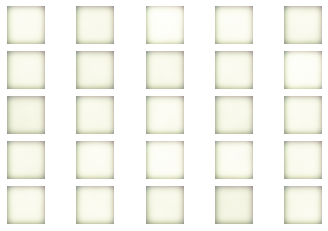

100 [D loss: 0.743421] [G loss: 1.087694]
img_shape:  (25, 32, 32, 3)


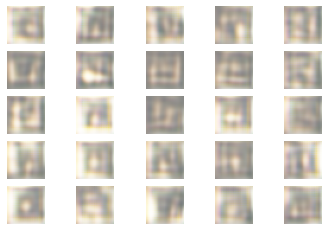

200 [D loss: 0.707538] [G loss: 0.719424]
img_shape:  (25, 32, 32, 3)


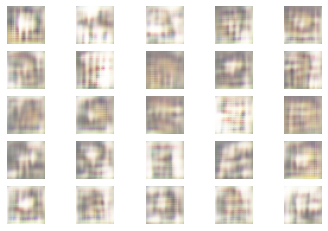

300 [D loss: 0.686708] [G loss: 0.804593]
img_shape:  (25, 32, 32, 3)


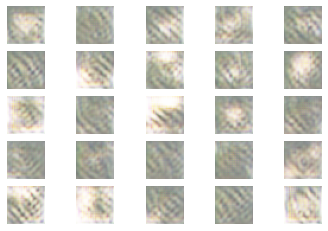

400 [D loss: 0.674525] [G loss: 0.790359]
img_shape:  (25, 32, 32, 3)


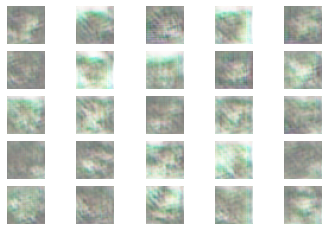

500 [D loss: 0.683754] [G loss: 0.734439]
img_shape:  (25, 32, 32, 3)


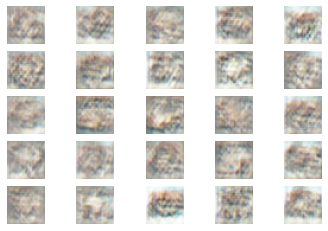

600 [D loss: 0.678583] [G loss: 0.697673]
img_shape:  (25, 32, 32, 3)


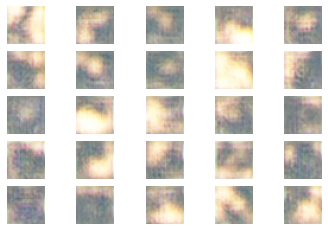

700 [D loss: 0.683947] [G loss: 0.728809]
img_shape:  (25, 32, 32, 3)


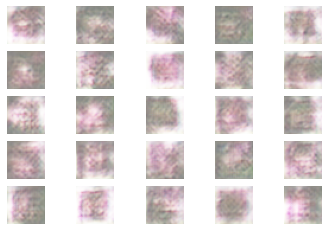

800 [D loss: 0.700813] [G loss: 0.749708]
img_shape:  (25, 32, 32, 3)


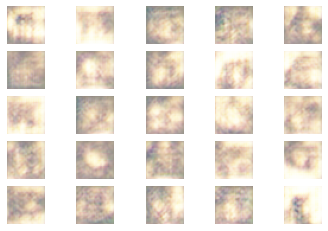

900 [D loss: 0.700147] [G loss: 0.743666]
img_shape:  (25, 32, 32, 3)


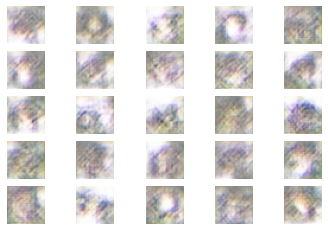

1000 [D loss: 0.672730] [G loss: 0.722497]
img_shape:  (25, 32, 32, 3)


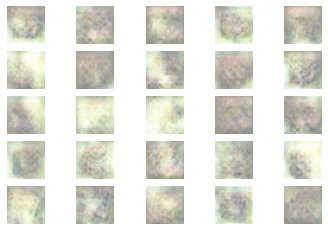

1100 [D loss: 0.695460] [G loss: 0.768768]
img_shape:  (25, 32, 32, 3)


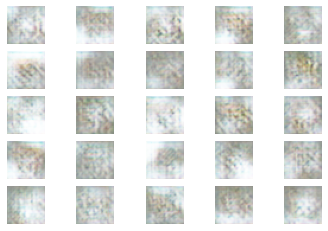

1200 [D loss: 0.686848] [G loss: 0.753599]
img_shape:  (25, 32, 32, 3)


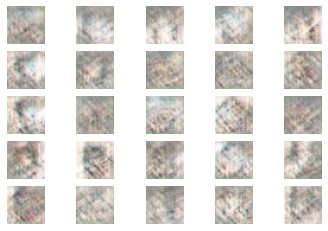

1300 [D loss: 0.693905] [G loss: 0.785062]
img_shape:  (25, 32, 32, 3)


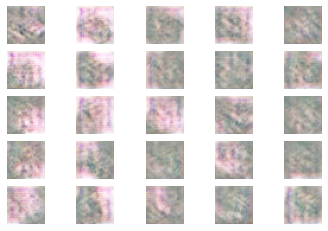

1400 [D loss: 0.705586] [G loss: 0.740049]
img_shape:  (25, 32, 32, 3)


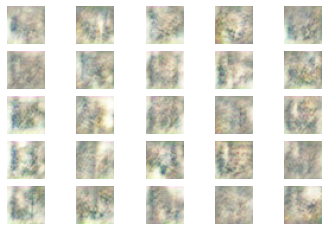

1500 [D loss: 0.702339] [G loss: 0.782734]
img_shape:  (25, 32, 32, 3)


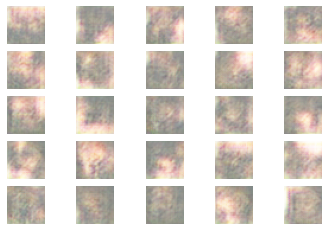

1600 [D loss: 0.703071] [G loss: 0.700338]
img_shape:  (25, 32, 32, 3)


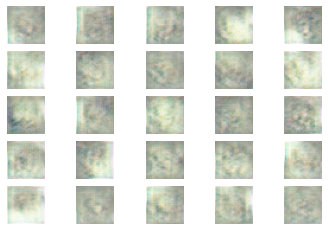

1700 [D loss: 0.714490] [G loss: 0.740796]
img_shape:  (25, 32, 32, 3)


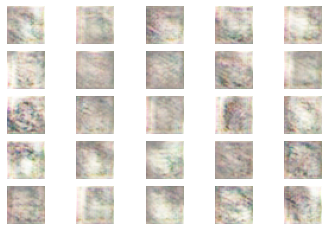

1800 [D loss: 0.697606] [G loss: 0.764328]
img_shape:  (25, 32, 32, 3)


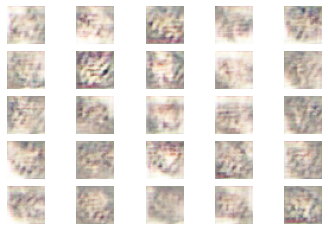

1900 [D loss: 0.692602] [G loss: 0.773238]
img_shape:  (25, 32, 32, 3)


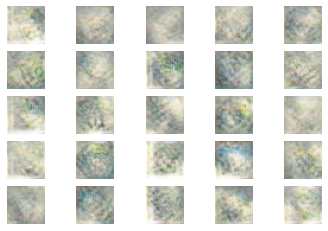

2000 [D loss: 0.700174] [G loss: 0.752357]
img_shape:  (25, 32, 32, 3)


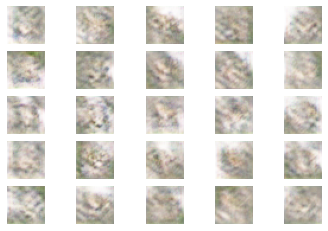

2100 [D loss: 0.680921] [G loss: 0.729879]
img_shape:  (25, 32, 32, 3)


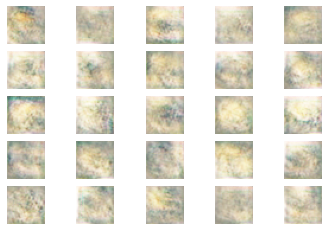

2200 [D loss: 0.698892] [G loss: 0.723898]
img_shape:  (25, 32, 32, 3)


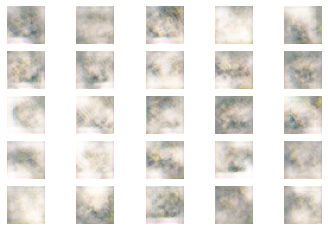

2300 [D loss: 0.707512] [G loss: 0.736981]
img_shape:  (25, 32, 32, 3)


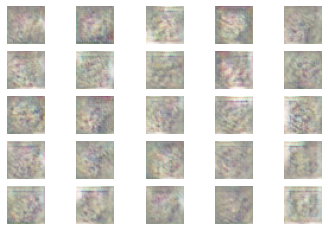

2400 [D loss: 0.740197] [G loss: 0.720059]
img_shape:  (25, 32, 32, 3)


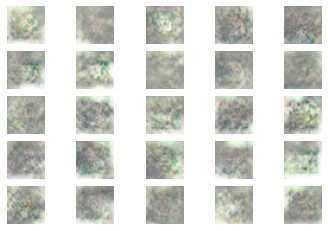

2500 [D loss: 0.688995] [G loss: 0.729302]
img_shape:  (25, 32, 32, 3)


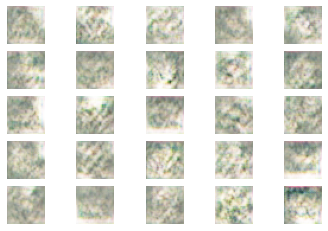

2600 [D loss: 0.722322] [G loss: 0.755629]
img_shape:  (25, 32, 32, 3)


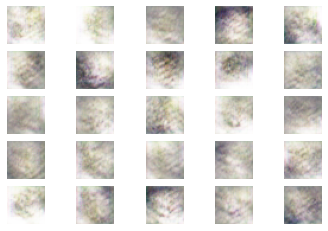

2700 [D loss: 0.692106] [G loss: 0.778388]
img_shape:  (25, 32, 32, 3)


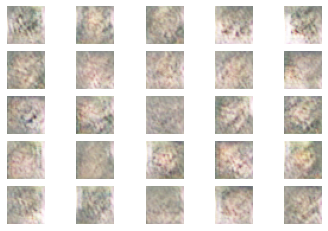

2800 [D loss: 0.697730] [G loss: 0.781533]
img_shape:  (25, 32, 32, 3)


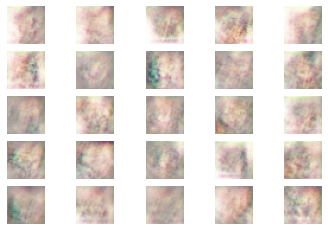

2900 [D loss: 0.689561] [G loss: 0.828106]
img_shape:  (25, 32, 32, 3)


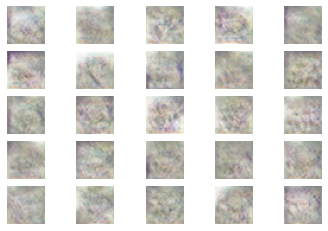

3000 [D loss: 0.700801] [G loss: 0.715314]
img_shape:  (25, 32, 32, 3)


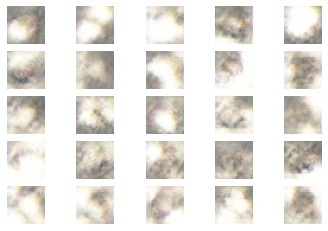

3100 [D loss: 0.683874] [G loss: 0.744204]
img_shape:  (25, 32, 32, 3)


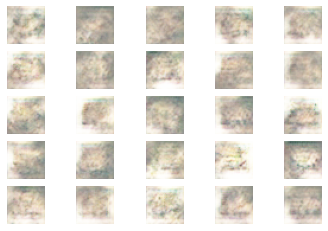

3200 [D loss: 0.701955] [G loss: 0.749660]
img_shape:  (25, 32, 32, 3)


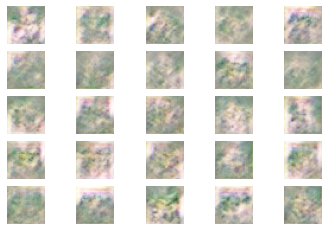

3300 [D loss: 0.698345] [G loss: 0.734991]
img_shape:  (25, 32, 32, 3)


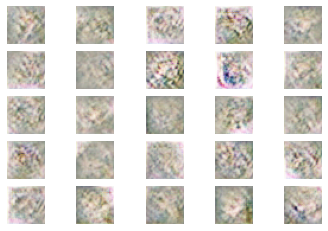

3400 [D loss: 0.709318] [G loss: 0.726638]
img_shape:  (25, 32, 32, 3)


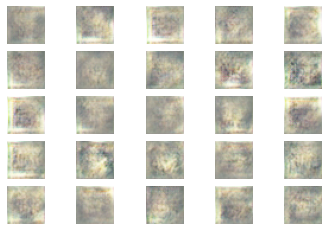

3500 [D loss: 0.683440] [G loss: 0.793825]
img_shape:  (25, 32, 32, 3)


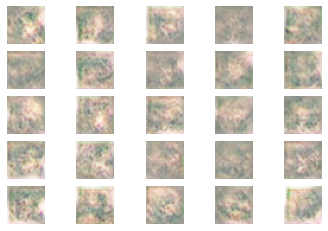

3600 [D loss: 0.692187] [G loss: 0.761221]
img_shape:  (25, 32, 32, 3)


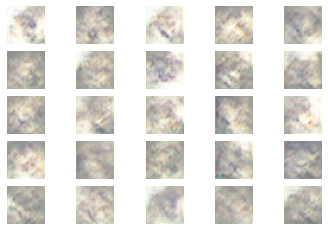

3700 [D loss: 0.684866] [G loss: 0.743506]
img_shape:  (25, 32, 32, 3)


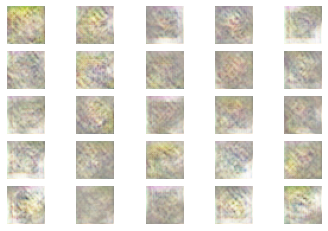

3800 [D loss: 0.698857] [G loss: 0.767030]
img_shape:  (25, 32, 32, 3)


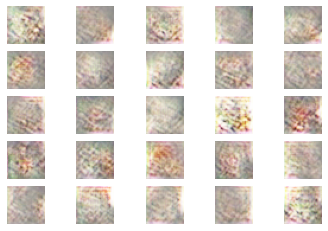

3900 [D loss: 0.699784] [G loss: 0.802098]
img_shape:  (25, 32, 32, 3)


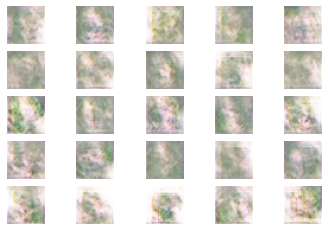

4000 [D loss: 0.753646] [G loss: 0.825461]
img_shape:  (25, 32, 32, 3)


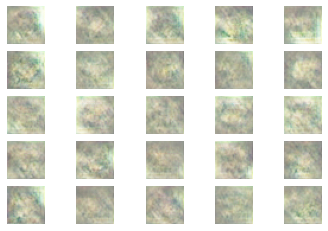

4100 [D loss: 0.679922] [G loss: 0.725403]
img_shape:  (25, 32, 32, 3)


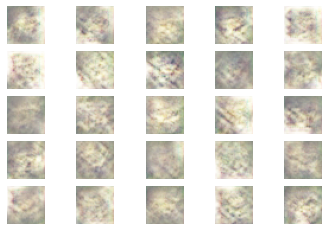

4200 [D loss: 0.691678] [G loss: 0.736635]
img_shape:  (25, 32, 32, 3)


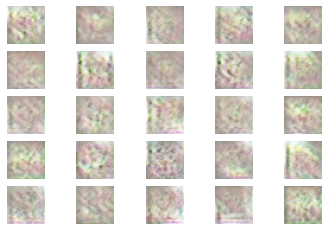

4300 [D loss: 0.685868] [G loss: 0.742579]
img_shape:  (25, 32, 32, 3)


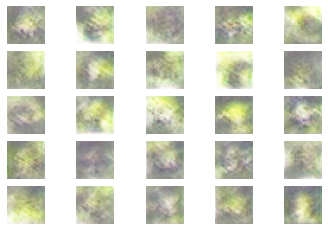

4400 [D loss: 0.696089] [G loss: 0.730885]
img_shape:  (25, 32, 32, 3)


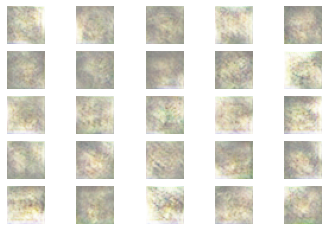

4500 [D loss: 0.697897] [G loss: 0.757084]
img_shape:  (25, 32, 32, 3)


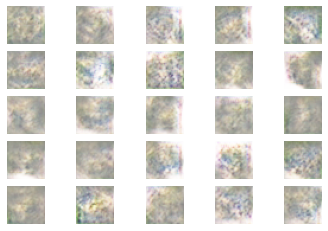

4600 [D loss: 0.686122] [G loss: 0.701303]
img_shape:  (25, 32, 32, 3)


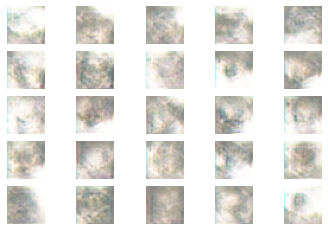

4700 [D loss: 0.704469] [G loss: 0.781292]
img_shape:  (25, 32, 32, 3)


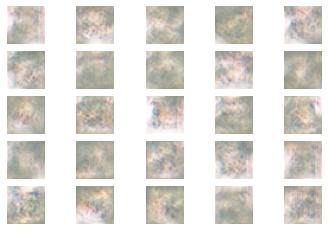

4800 [D loss: 0.694894] [G loss: 0.725458]
img_shape:  (25, 32, 32, 3)


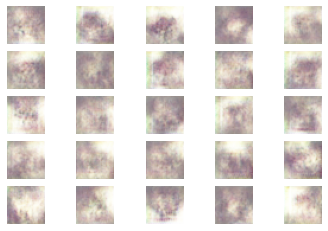

4900 [D loss: 0.702854] [G loss: 0.693005]
img_shape:  (25, 32, 32, 3)


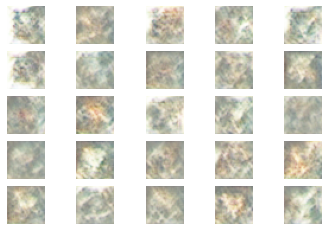

5000 [D loss: 0.683571] [G loss: 0.778591]
img_shape:  (25, 32, 32, 3)


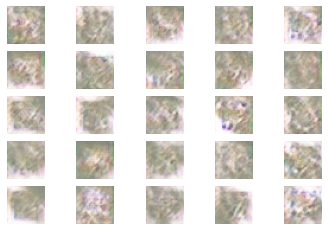

5100 [D loss: 0.688672] [G loss: 0.806560]
img_shape:  (25, 32, 32, 3)


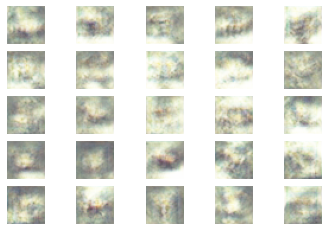

5200 [D loss: 0.678971] [G loss: 0.836822]
img_shape:  (25, 32, 32, 3)


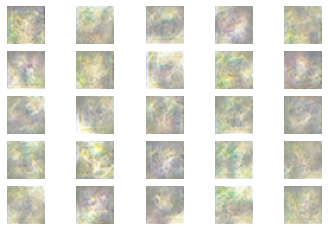

5300 [D loss: 0.720492] [G loss: 0.825283]
img_shape:  (25, 32, 32, 3)


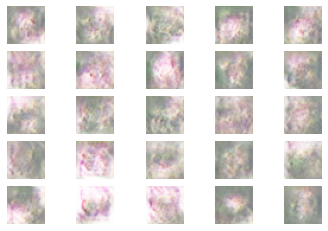

5400 [D loss: 0.681552] [G loss: 0.772663]
img_shape:  (25, 32, 32, 3)


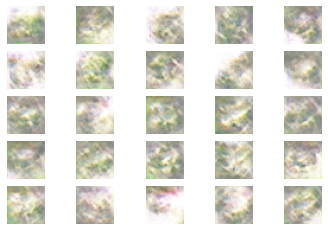

5500 [D loss: 0.682506] [G loss: 0.700671]
img_shape:  (25, 32, 32, 3)


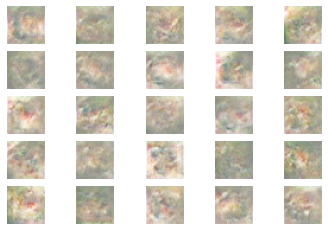

5600 [D loss: 0.669432] [G loss: 0.784349]
img_shape:  (25, 32, 32, 3)


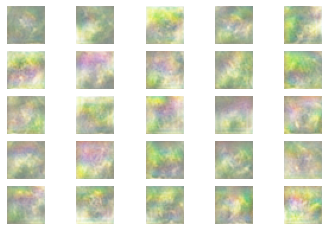

5700 [D loss: 0.701163] [G loss: 0.754644]
img_shape:  (25, 32, 32, 3)


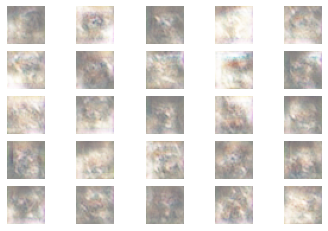

5800 [D loss: 0.690077] [G loss: 0.757993]
img_shape:  (25, 32, 32, 3)


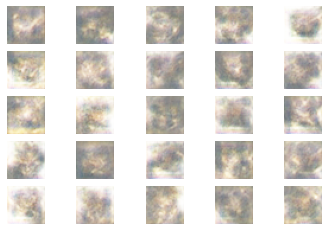

5900 [D loss: 0.759156] [G loss: 0.884116]
img_shape:  (25, 32, 32, 3)


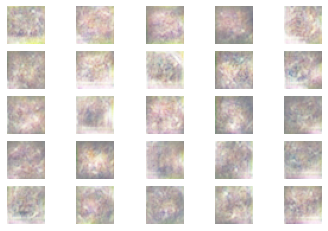

6000 [D loss: 1.008224] [G loss: 1.370302]
img_shape:  (25, 32, 32, 3)


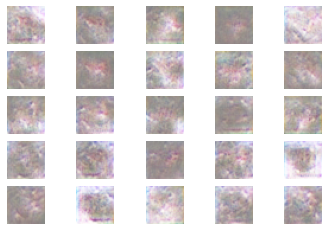

6100 [D loss: 0.691441] [G loss: 0.743832]
img_shape:  (25, 32, 32, 3)


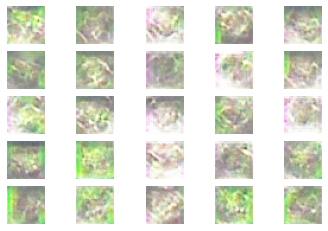

6200 [D loss: 0.690812] [G loss: 0.790037]
img_shape:  (25, 32, 32, 3)


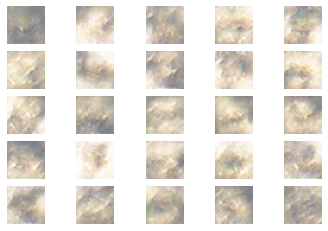

6300 [D loss: 0.693986] [G loss: 0.670737]
img_shape:  (25, 32, 32, 3)


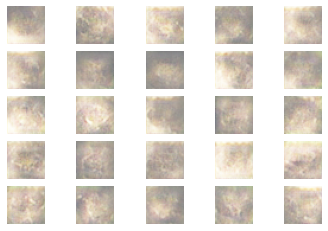

6400 [D loss: 0.701211] [G loss: 0.730027]
img_shape:  (25, 32, 32, 3)


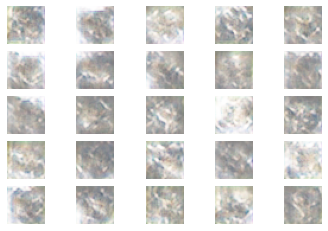

6500 [D loss: 0.850754] [G loss: 0.810234]
img_shape:  (25, 32, 32, 3)


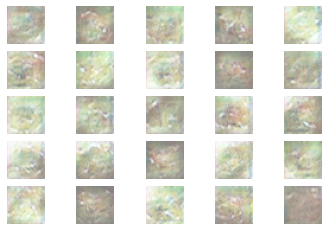

6600 [D loss: 0.766789] [G loss: 0.991733]
img_shape:  (25, 32, 32, 3)


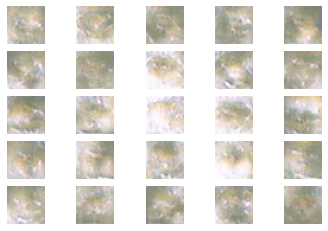

6700 [D loss: 0.696794] [G loss: 0.761699]
img_shape:  (25, 32, 32, 3)


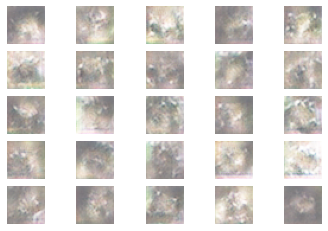

6800 [D loss: 0.683331] [G loss: 0.709407]
img_shape:  (25, 32, 32, 3)


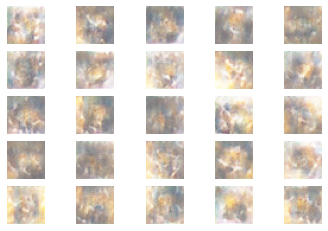

6900 [D loss: 0.804892] [G loss: 0.620901]
img_shape:  (25, 32, 32, 3)


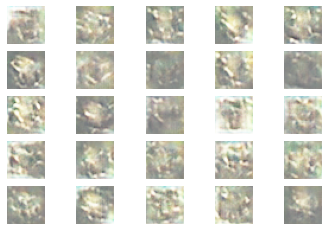

7000 [D loss: 0.681855] [G loss: 0.739070]
img_shape:  (25, 32, 32, 3)


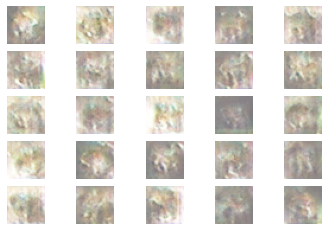

7100 [D loss: 0.728152] [G loss: 0.993601]
img_shape:  (25, 32, 32, 3)


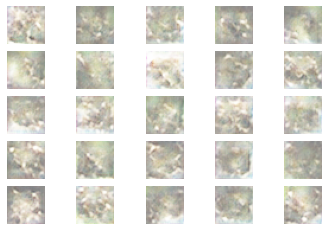

7200 [D loss: 0.720838] [G loss: 0.734886]
img_shape:  (25, 32, 32, 3)


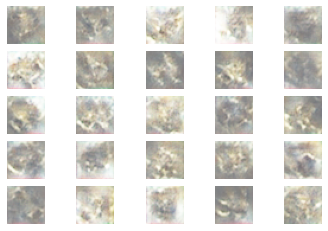

7300 [D loss: 0.739157] [G loss: 2.289448]
img_shape:  (25, 32, 32, 3)


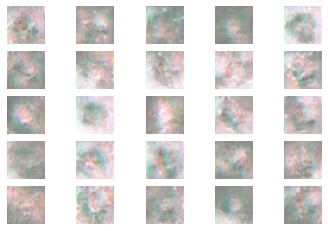

7400 [D loss: 0.671807] [G loss: 0.773788]
img_shape:  (25, 32, 32, 3)


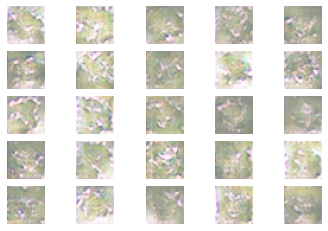

7500 [D loss: 0.665976] [G loss: 0.799794]
img_shape:  (25, 32, 32, 3)


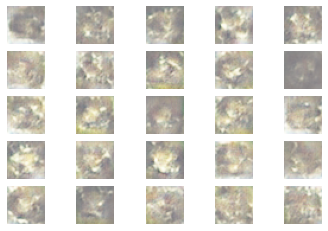

7600 [D loss: 0.707029] [G loss: 0.785822]
img_shape:  (25, 32, 32, 3)


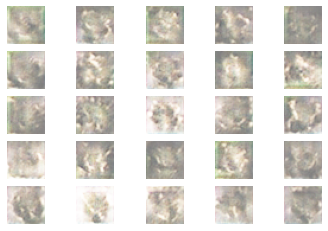

7700 [D loss: 0.693360] [G loss: 0.789868]
img_shape:  (25, 32, 32, 3)


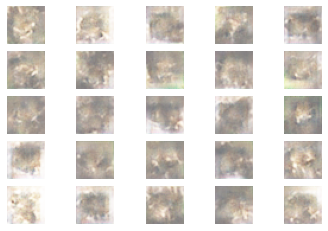

7800 [D loss: 0.720452] [G loss: 0.774923]
img_shape:  (25, 32, 32, 3)


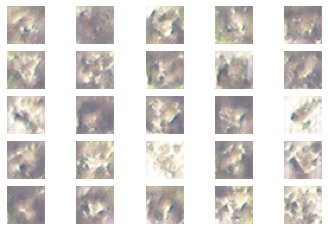

7900 [D loss: 0.705001] [G loss: 0.819827]
img_shape:  (25, 32, 32, 3)


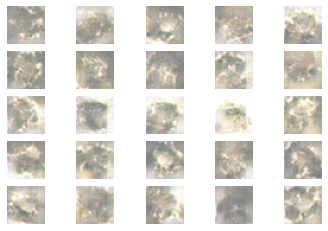

8000 [D loss: 0.685719] [G loss: 0.978793]
img_shape:  (25, 32, 32, 3)


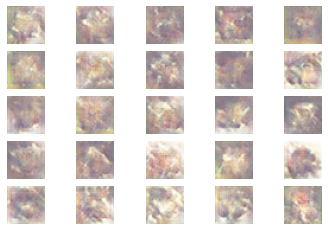

8100 [D loss: 0.735901] [G loss: 0.684630]
img_shape:  (25, 32, 32, 3)


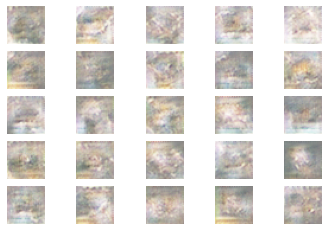

8200 [D loss: 0.708369] [G loss: 0.780857]
img_shape:  (25, 32, 32, 3)


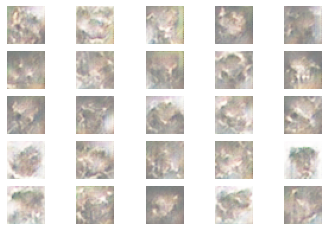

8300 [D loss: 0.649875] [G loss: 0.712842]
img_shape:  (25, 32, 32, 3)


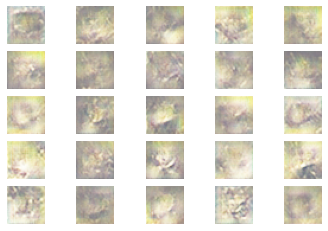

8400 [D loss: 0.666201] [G loss: 0.816018]
img_shape:  (25, 32, 32, 3)


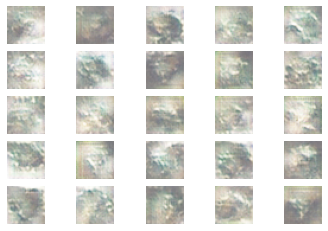

8500 [D loss: 0.744268] [G loss: 0.715709]
img_shape:  (25, 32, 32, 3)


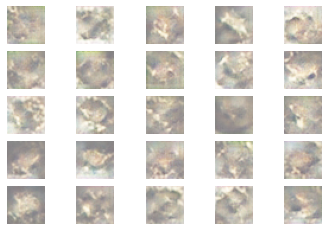

8600 [D loss: 0.663710] [G loss: 0.954909]
img_shape:  (25, 32, 32, 3)


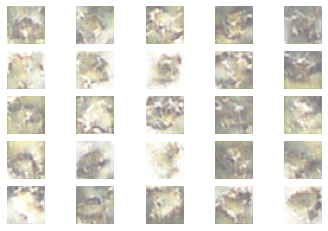

8700 [D loss: 0.697810] [G loss: 0.939714]
img_shape:  (25, 32, 32, 3)


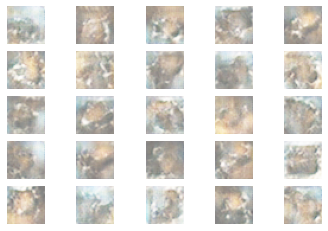

8800 [D loss: 0.645272] [G loss: 0.859360]
img_shape:  (25, 32, 32, 3)


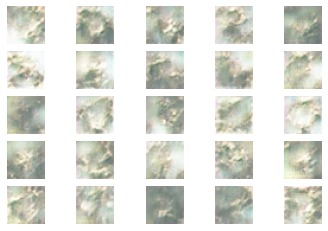

8900 [D loss: 0.663805] [G loss: 0.738238]
img_shape:  (25, 32, 32, 3)


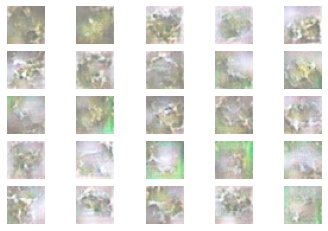

9000 [D loss: 0.746354] [G loss: 0.743523]
img_shape:  (25, 32, 32, 3)


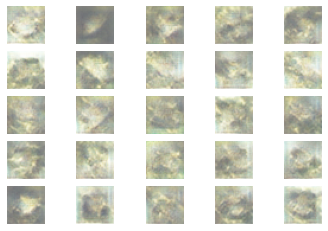

9100 [D loss: 0.679208] [G loss: 0.811256]
img_shape:  (25, 32, 32, 3)


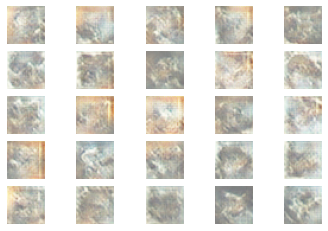

9200 [D loss: 0.701666] [G loss: 0.760928]
img_shape:  (25, 32, 32, 3)


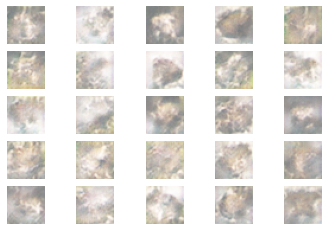

9300 [D loss: 0.684129] [G loss: 0.822725]
img_shape:  (25, 32, 32, 3)


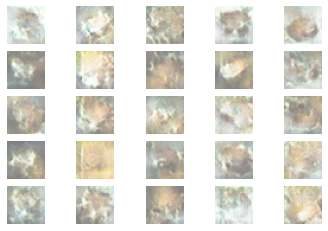

9400 [D loss: 0.656015] [G loss: 0.800614]
img_shape:  (25, 32, 32, 3)


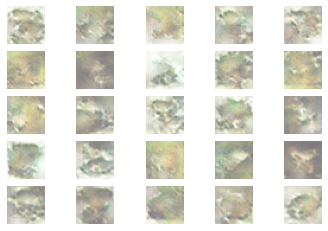

9500 [D loss: 0.699057] [G loss: 0.925427]
img_shape:  (25, 32, 32, 3)


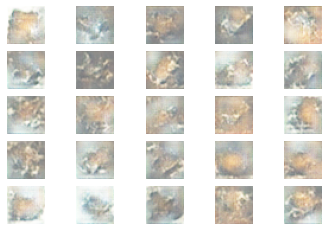

9600 [D loss: 0.681371] [G loss: 0.879428]
img_shape:  (25, 32, 32, 3)


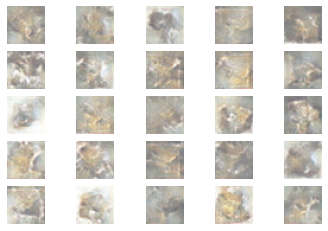

9700 [D loss: 0.713019] [G loss: 0.885993]
img_shape:  (25, 32, 32, 3)


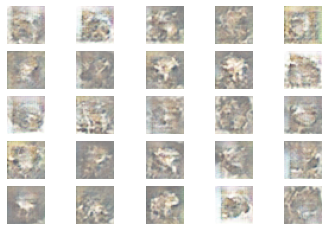

9800 [D loss: 0.751577] [G loss: 0.737517]
img_shape:  (25, 32, 32, 3)


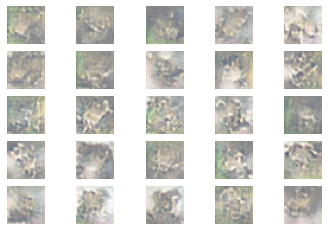

9900 [D loss: 0.717764] [G loss: 0.816591]
img_shape:  (25, 32, 32, 3)


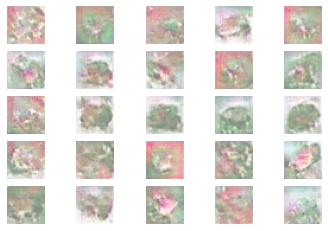

In [10]:
import os
from keras.preprocessing import image

(x_train, y_train), (_, _) = keras.datasets.cifar10.load_data()
#(x_train, _), (_, _) = keras.datasets.mnist.load_data()

# Select frog images (class 6)
x_train = x_train[y_train.flatten() == 6]

# Normalize data
x_train = x_train.reshape(
    (x_train.shape[0],) + (height, width, channels)).astype('float32') / 255.

iterations = 10000
batch_size = 20
save_dir = '/home/ubuntu/gan_images/'

# Start training loop
start = 0
for step in range(iterations):
    # Sample random points in the latent space
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))

    # Decode them to fake images
    generated_images = generator.predict(random_latent_vectors)

    # Combine them with real images
    stop = start + batch_size
    real_images = x_train[start: stop]
    combined_images = np.concatenate([generated_images, real_images])

    # Assemble labels discriminating real from fake images
    labels = np.concatenate([np.ones((batch_size, 1)),
                             np.zeros((batch_size, 1))])
    # Add random noise to the labels - important trick!
    labels += 0.05 * np.random.random(labels.shape)

    # Train the discriminator
    d_loss = discriminator.train_on_batch(combined_images, labels)

    # sample random points in the latent space
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))

    # Assemble labels that say "all real images"
    misleading_targets = np.zeros((batch_size, 1))

    # Train the generator (via the gan model,
    # where the discriminator weights are frozen)
    a_loss = gan.train_on_batch(random_latent_vectors, misleading_targets)
    
    start += batch_size
    if start > len(x_train) - batch_size:
      start = 0

    # at save interval save generated image samples, make summary
    if step % sample_interval == 0:
      # plot progress: d_loss[0]-discr loss, d_loss[1]-discr acc
      print('%d [D loss: %f] [G loss: %f]' % (step, d_loss, a_loss))
      # output a sample of generated images
      sample_images(step, latent_dim, generator)
